In [1]:
from tensorflow.keras.models import Model, load_model
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import numpy as np
from skimage import io, color
from keras.preprocessing import image
import numpy as np
from skimage import io, color, transform
from scipy.spatial.distance import cdist
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import os
def read_image(img_id, dir, image_size):
    try:
        img = load_img(dir + "/" + img_id, target_size=(image_size,image_size))
        img = img_to_array(img)
        return img
    except:
        return None
    
def get_images(files, image_size):
    images = []
    for image in files:
        img = read_image(image, directory, image_size)
        if not img is None:
            img = np.array(img, dtype=float)
            images.append(img)
    images = np.array(images, dtype=float)
    return images

Using TensorFlow backend.


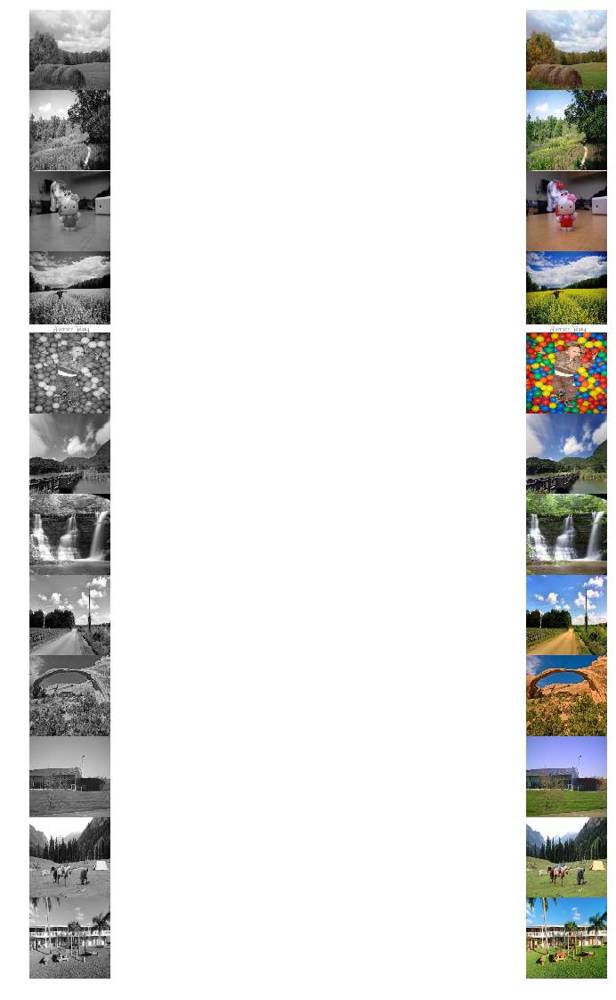

In [2]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/demo/places"
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
images = get_images(files, image_size)

images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

rows = len(files)
columns = 2
f, axarr = plt.subplots(rows,columns, figsize=(20,20), sharex=True, gridspec_kw=dict(wspace=0, hspace=0))
for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(images[i])
    axarr[i, 1].axis("off")
plt.show()

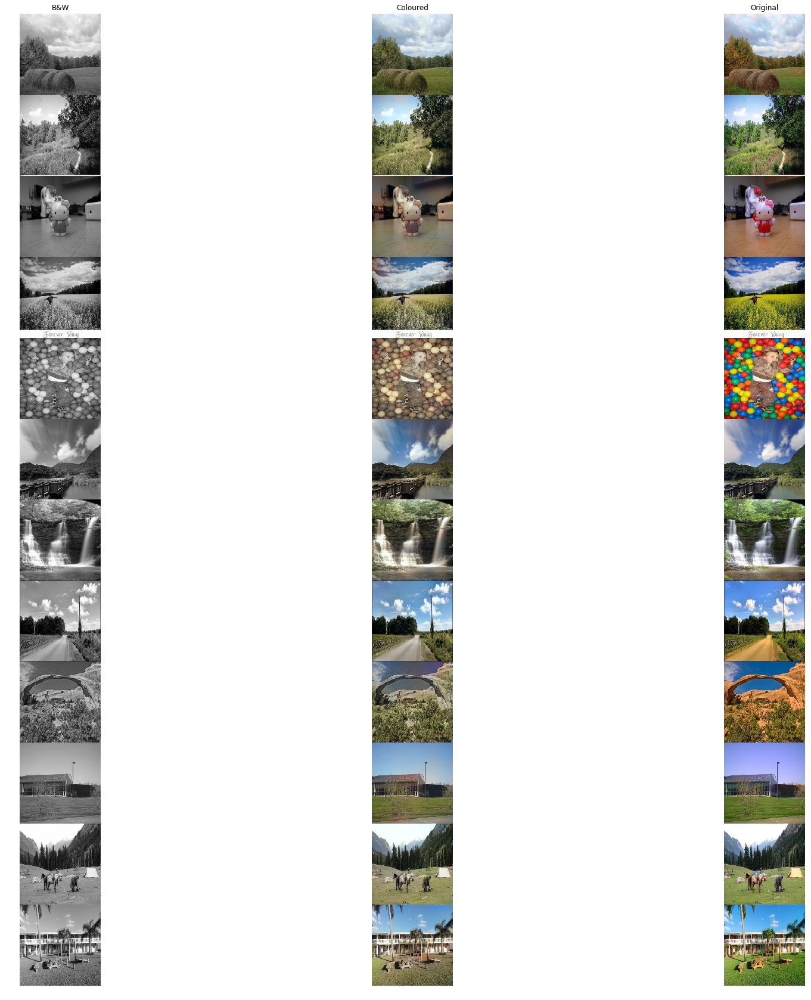

In [3]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/demo/places"

model = load_model("/home/carlos/Image_Colorization/output/MSE/2019-02-15--14h08m/model.h5")
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_mse = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = len(files)
columns = 3
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(images[i])   
    axarr[i, 2].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured")
axarr[0, 2].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 2 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 1 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 4 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 3 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


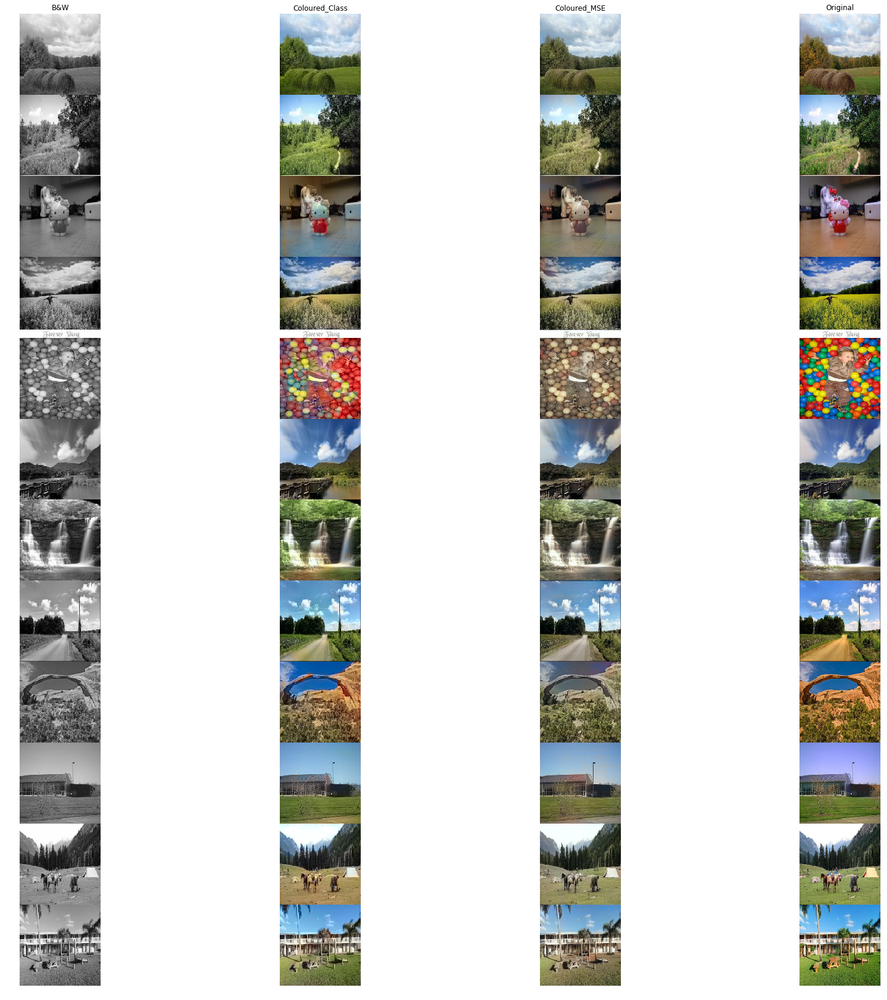

In [4]:
image_size = 128
directory = "/home/carlos/Image_Colorization/data/demo/places"
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
model = load_model("/home/carlos/Image_Colorization/output/2019-02-04--10h42m/model.h5")
buckets = np.load("../model/pts_in_hull.npy")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output.reshape(len(files), image_size, image_size, 313)

values = np.arange(0, 313)
t = 0.38
transformed = np.exp(np.log(output + 1e-8)/t)
sum_colors = np.expand_dims(np.sum(transformed, axis=3), axis=3)
result = transformed/sum_colors
classification = np.dot(result, buckets)

combined_class = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), classification), axis=3)

rows = len(files)
columns = 4
f, axarr = plt.subplots(rows,columns, figsize=(30, 30))

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 2].axis("off")

    axarr[i, 3].imshow(images[i])
    axarr[i, 3].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_Class")
axarr[0, 2].set_title("Coloured_MSE")
axarr[0, 3].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

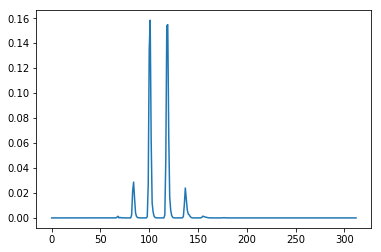

In [5]:
plt.plot(output[0][64, 64, ])
plt.show()

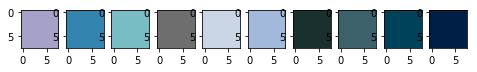

In [6]:
highest_colors = np.argpartition(output[0][64, 64, ], -10)[-10:]
fig=plt.figure(figsize=(8, 8))
for i in range(1, 11):
    img = np.zeros((8, 8, 3))
    img[:, :, 0] = bw_lab_images[i, 64, 64, 0]
    img[:, :, 1:] = buckets[highest_colors[i-1]]
    fig.add_subplot(1, 10, i)
    plt.imshow(color.lab2rgb(img))
plt.show()

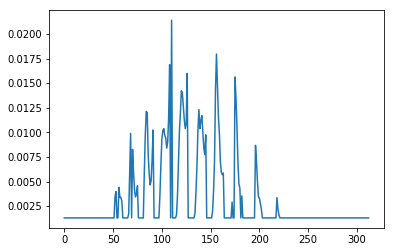

In [7]:
plt.plot(output[4][64, 64, ])
plt.show()

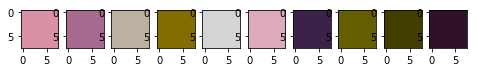

In [8]:
highest_colors = np.argpartition(output[4][64, 64, ], -10)[-10:]
fig=plt.figure(figsize=(8, 8))
for i in range(1, 11):
    img = np.zeros((8, 8, 3))
    img[:, :, 0] = bw_lab_images[i, 64, 64, 0]
    img[:, :, 1:] = buckets[highest_colors[i-1]]
    fig.add_subplot(1, 10, i)
    plt.imshow(color.lab2rgb(img))
plt.show()

/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 14 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


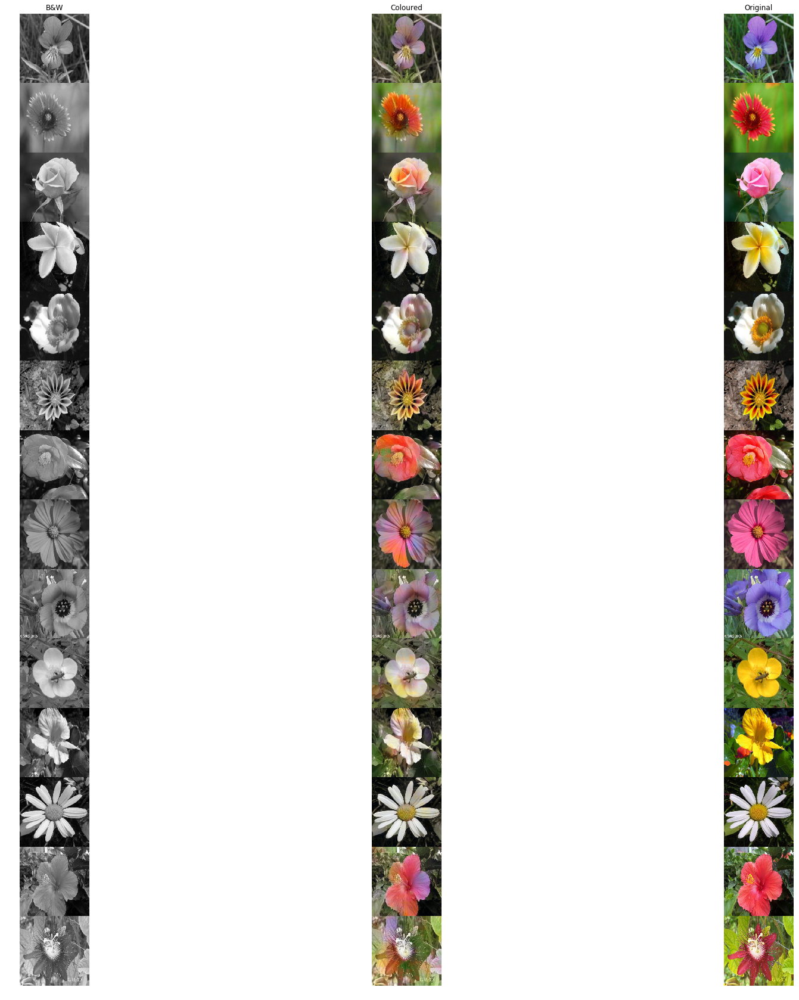

In [9]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/demo/flowers"
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
model = load_model("/home/carlos/Image_Colorization/output/MSE/flowers/best.hdf5")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_mse = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = len(files)
columns = 3
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 1].axis("off")
    
    axarr[i, 2].imshow(images[i])
    axarr[i, 2].axis("off")
    
axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured")
axarr[0, 2].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 15 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


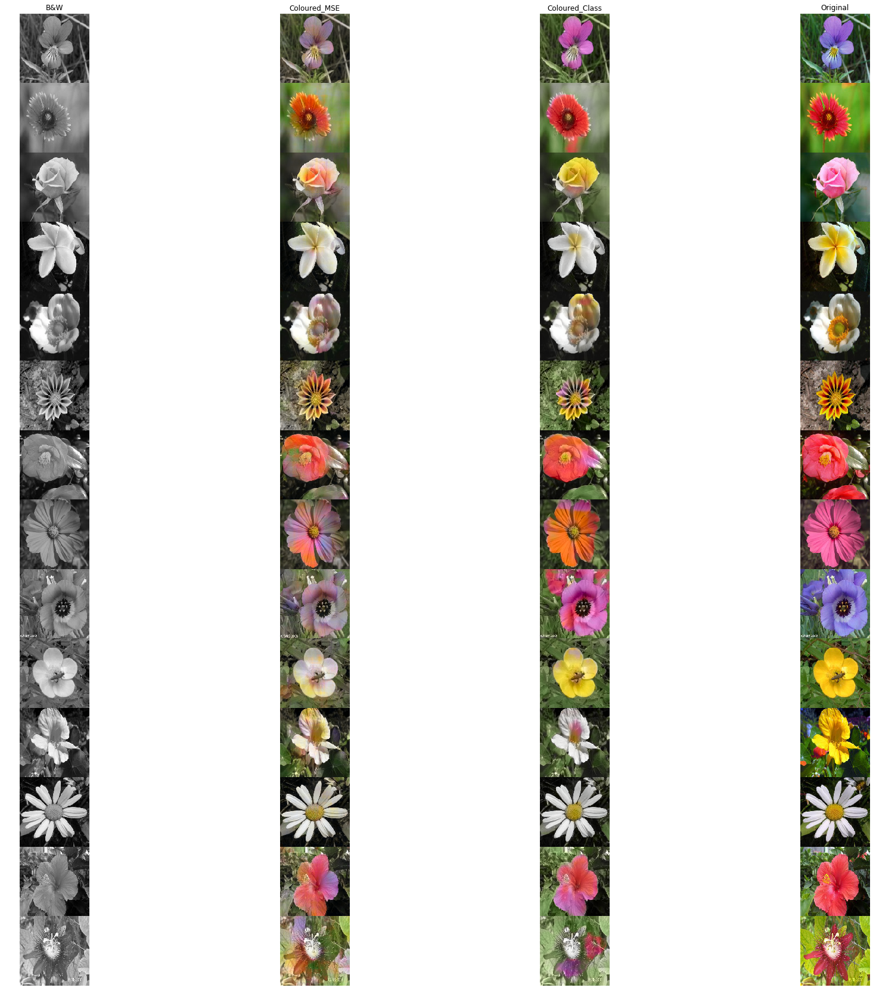

In [10]:
image_size = 128
directory = "/home/carlos/Image_Colorization/data/demo/flowers"
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

model = load_model("/home/carlos/Image_Colorization/output/flowers_aug_2/best.hdf5")
buckets = np.load("../model/pts_in_hull.npy")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output.reshape(len(files), image_size, image_size, 313)

values = np.arange(0, 313)
t = 0.38
transformed = np.exp(np.log(output + 1e-8)/t)
sum_colors = np.expand_dims(np.sum(transformed, axis=3), axis=3)
result = transformed/sum_colors
output = np.dot(result, buckets)

combined_class = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)

rows = len(files)
columns = 4
f, axarr = plt.subplots(rows,columns, figsize=(30, 30))

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 2].axis("off")

    axarr[i, 3].imshow(images[i])
    axarr[i, 3].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_MSE")
axarr[0, 2].set_title("Coloured_Class")
axarr[0, 3].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 18 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 47 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/

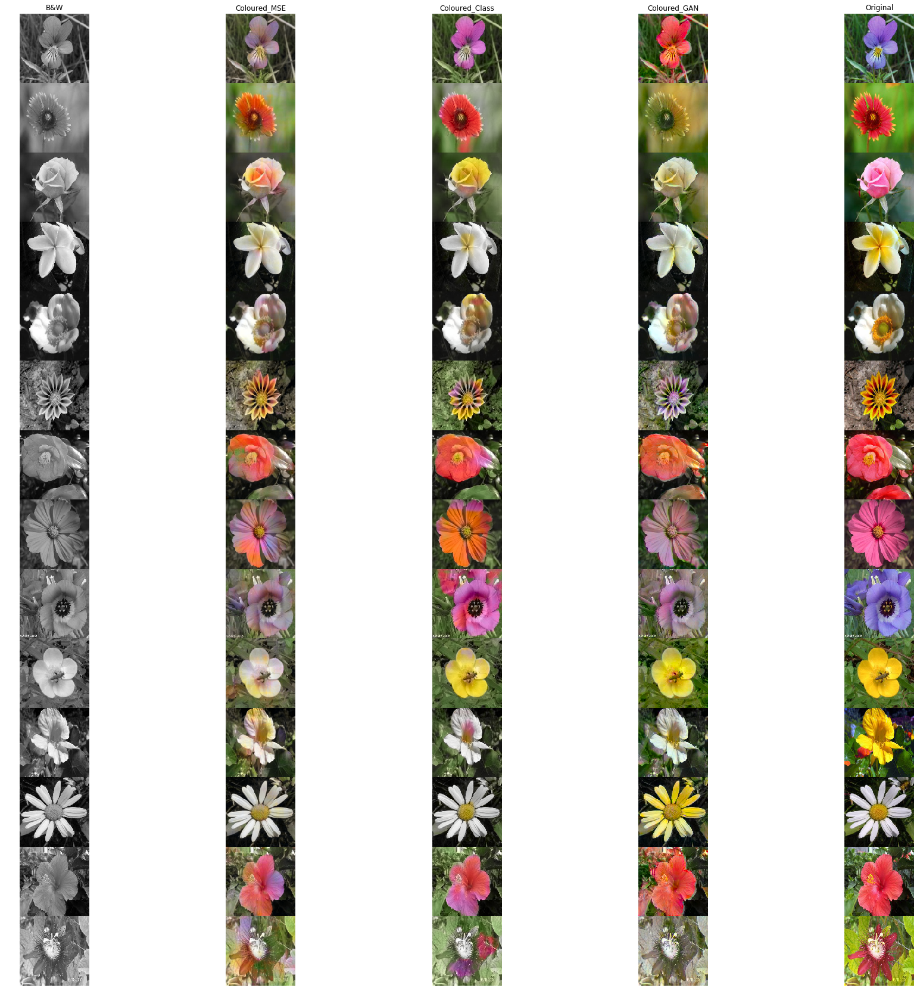

In [11]:
from keras.models import Model, load_model
image_size = 128
directory = "/home/carlos/Image_Colorization/data/demo/flowers"
files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
model = load_model("/home/carlos/Image_Colorization/output/GAN/2019-02-26--19h16m/generator.h5")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_gan = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = len(files)
columns = 5
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(color.lab2rgb(transform.resize(combined_mse[i], (image_size, image_size))))
    axarr[i, 1].axis("off")
    
    axarr[i, 2].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 2].axis("off")
    
    axarr[i, 3].imshow(color.lab2rgb(combined_gan[i]))
    axarr[i, 3].axis("off")
    
    axarr[i, 4].imshow(images[i])
    axarr[i, 4].axis("off")
    
axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_MSE")
axarr[0, 2].set_title("Coloured_Class")
axarr[0, 3].set_title("Coloured_GAN")
axarr[0, 4].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()